##### Use the cell below to display images side by side.  This may have impacts on display of non-image data.

In [49]:
import pandas as pd
import numpy as np
from IPython.display import display, HTML

CSS = """
.output {
    flex-direction: row;
}
"""

HTML('<style>{}</style>'.format(CSS))


Define the folder paths and image files:

In [50]:
from IPython.display import Image
import json, os
from matplotlib.patches import Polygon
%matplotlib inline
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import io
from matplotlib.pyplot import imshow
import numpy as np
from PIL import Image, ImageDraw, ImageColor, ImageFont, ImageChops, ImageOps
import ast

inputpath = './'
outputpath = './output/'
fnt = ImageFont.truetype("arial.ttf", 25)
imagename = "generic_form.png"
blankimg = "generic_form_blank.png"

image  = Image.open('{}{}'.format(inputpath, imagename))
image_blnk  = Image.open('{}{}'.format(inputpath, blankimg))

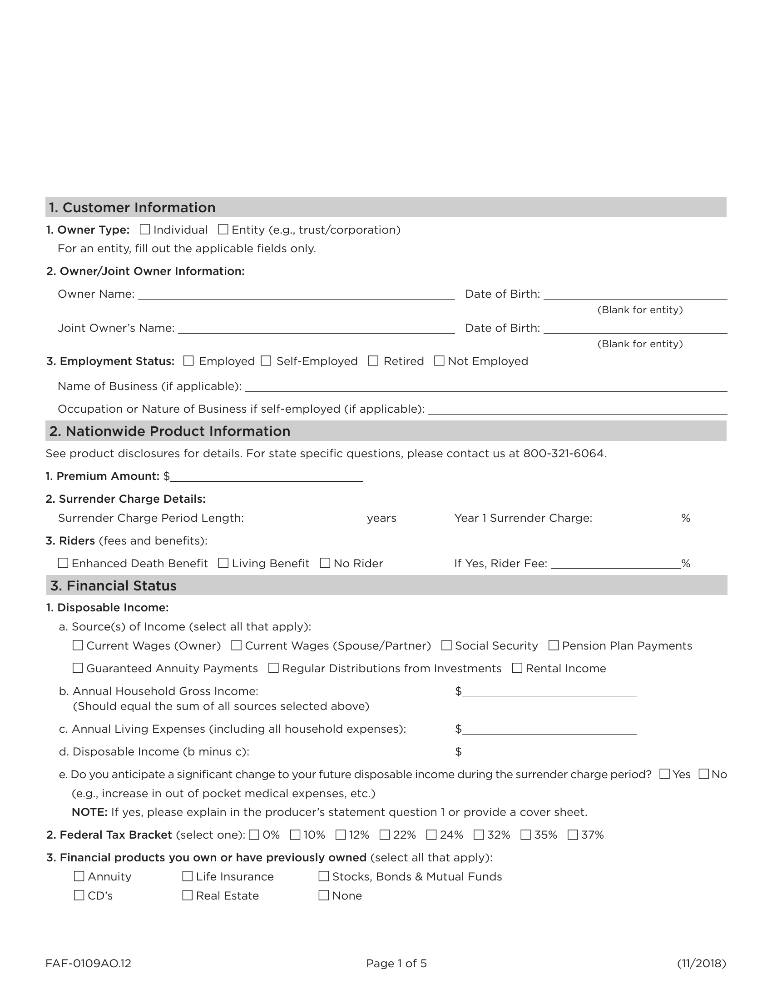

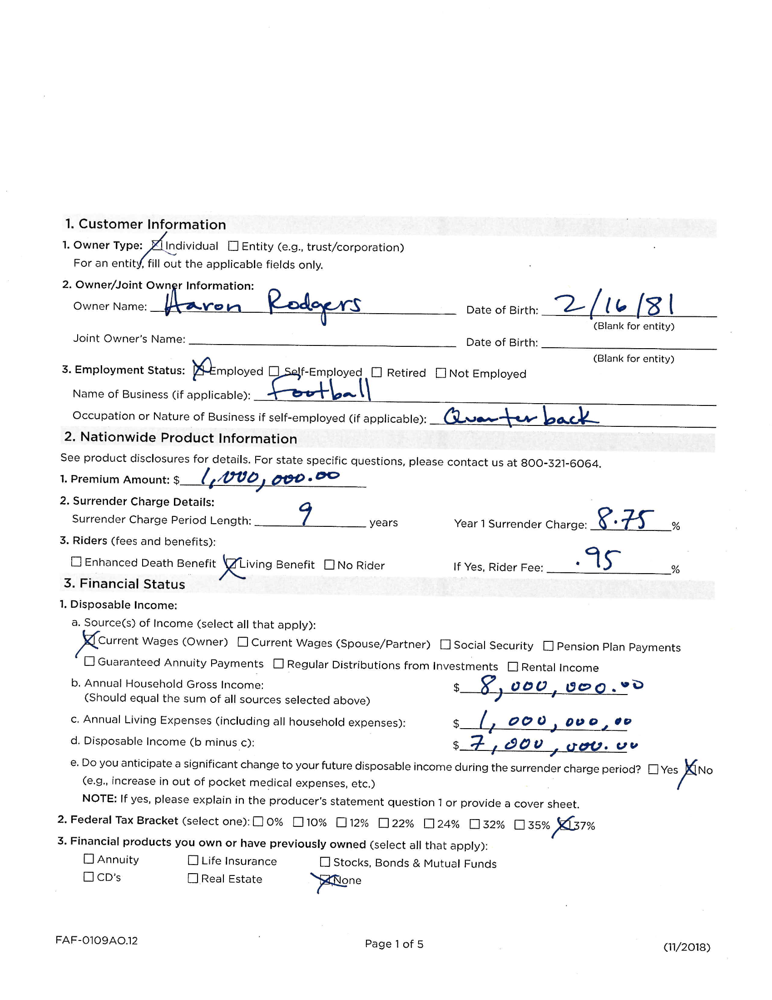

In [51]:
display(image_blnk)
display(image)

In order to process the form data, we will need to pre-process the file by removing form prompts from our scoring document.  This will eliminate noise from the form and make our scored output easier to evaluate

In [52]:
#Align blank image with new image

from __future__ import print_function
import cv2
import numpy as np
 
 
MAX_FEATURES = 1000
GOOD_MATCH_PERCENT = 0.05
 
 
def alignImages(im1, im2):
  
  # Convert images to grayscale
  im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
  im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
   
  # Detect ORB features and compute descriptors.
  orb = cv2.ORB_create(MAX_FEATURES)
  keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
  keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)
   
  # Match features.
  matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
  matches = matcher.match(descriptors1, descriptors2, None)
   
  # Sort matches by score
  matches.sort(key=lambda x: x.distance, reverse=False)
 
  # Remove not so good matches
  numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
  matches = matches[:numGoodMatches]
 
  # Draw top matches
  imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
  cv2.imwrite("{}matches.jpg".format(outputpath), imMatches)

  # Extract location of good matches
  points1 = np.zeros((len(matches), 2), dtype=np.float32)
  points2 = np.zeros((len(matches), 2), dtype=np.float32)
 
  for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt
   
  # Find homography
  h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)
 
  # Use homography
  height, width, channels = im2.shape
  im1Reg = cv2.warpPerspective(im1, h, (width, height))
   
  return im1Reg, h
 


reference:https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/

Use the `alignImages` function to align the input form with the blank form

In [53]:
  
# Read reference image
refFilename = '{}{}'.format(inputpath, blankimg)
print("Reading reference image : ", refFilename)
imReference = cv2.imread(refFilename, cv2.IMREAD_COLOR)

# Read image to be aligned
imFilename = '{}{}'.format(inputpath, imagename)
print("Reading image to align : ", imFilename);  
im = cv2.imread(imFilename, cv2.IMREAD_COLOR)

print("Aligning images ...")
# Registered image will be resotred in imReg. 
# The estimated homography will be stored in h. 
imReg, h = alignImages(im, imReference)

# Write aligned image to disk. 
outFilename = '{}{}_aligned.png'.format(outputpath, os.path.splitext(os.path.basename(imagename))[0])
print("Saving aligned image : ", outFilename); 
cv2.imwrite(outFilename, imReg)

# Print estimated homography
print("Estimated homography : \n",  h)


Reading reference image :  ./generic_form_blank.png
Reading image to align :  ./generic_form.png
Aligning images ...
Saving aligned image :  ./output/generic_form_aligned.png
Estimated homography : 
 [[ 1.03161863e+00  8.84325565e-03 -4.54439151e+01]
 [-1.03445766e-02  1.04253487e+00 -5.40119594e+01]
 [ 1.54825684e-06 -4.03890755e-06  1.00000000e+00]]


`matches.jpg` shows how OpenCV was able to align the features of the two documents.

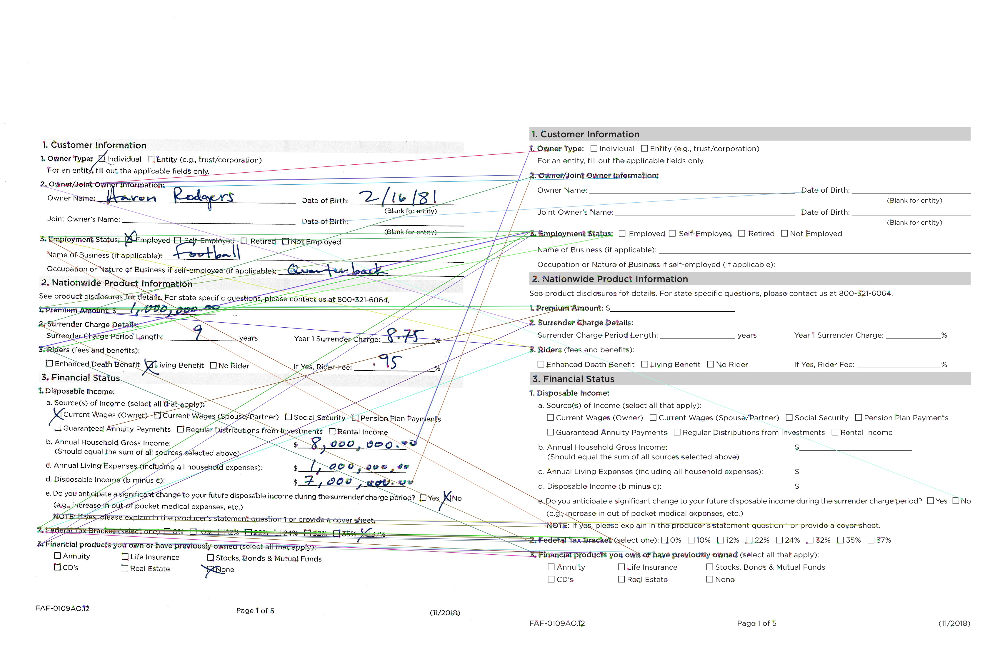

In [54]:
display(Image.open("{}matches.jpg".format(outputpath)))

Now that the input form and the blank form have been aligned, we can use masking techniques to remove form elements and isolate the form inputs.  Reference: https://www.learnopencv.com/tag/alpha-mask/

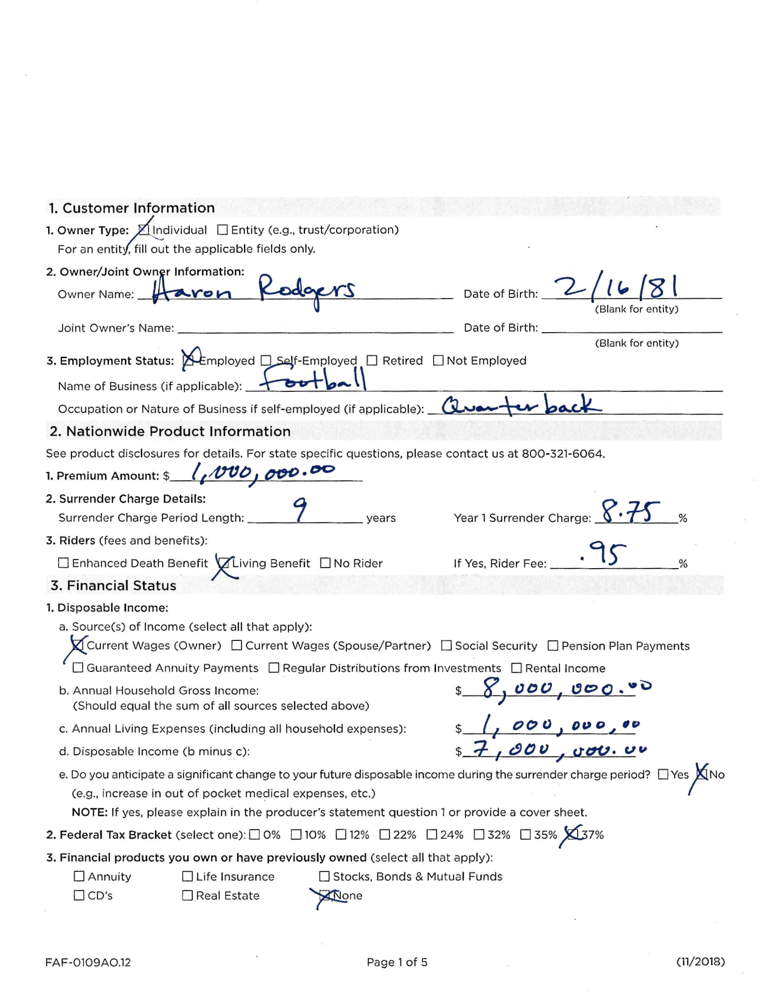

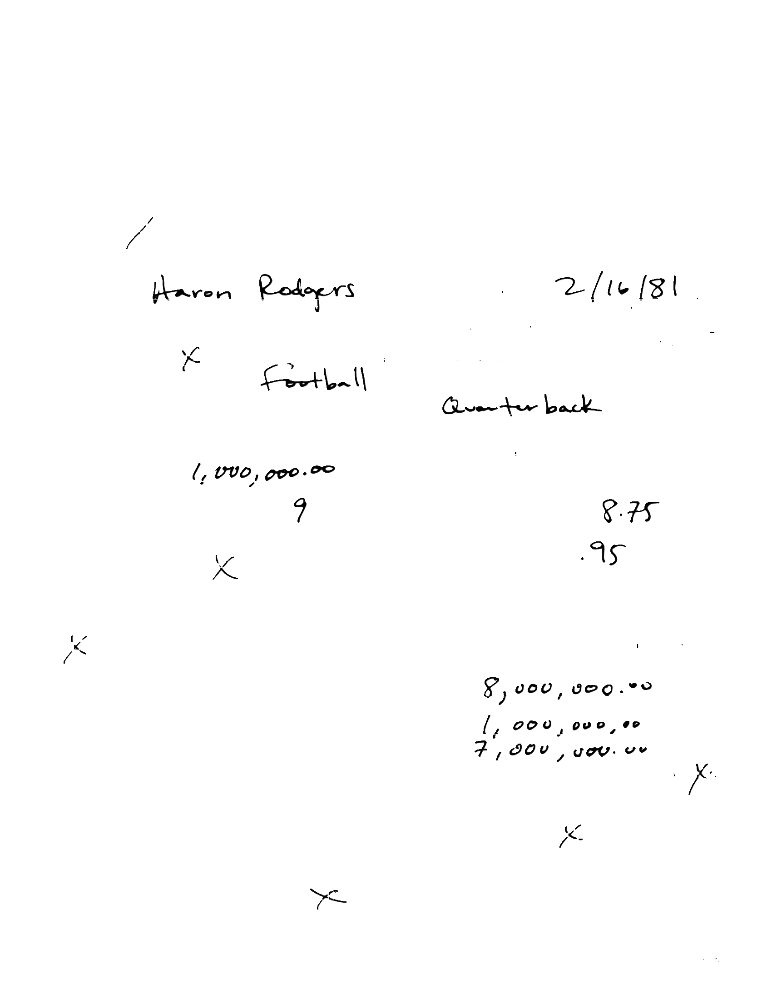

In [62]:
alignedImg = Image.open(outFilename)

tempimage = ImageChops.subtract(image_blnk,alignedImg)
#tempimage = ImageChops.subtract(image_blnk, tempimage)

mask1 = Image.eval(tempimage, lambda a: 0 if a <= 100 else 255)
inverted_image = ImageOps.invert(mask1)

img = np.array(inverted_image) 
img = img[:, :, ::-1].copy() 

###  The Denoising thresholds used can be modified to improve performance 
dst = cv2.fastNlMeansDenoising(img,None,60,7,21)

dst_img=cv2.cvtColor(dst, cv2.COLOR_BGR2GRAY) 
imagem = cv2.bitwise_not(dst_img)

### The blur can be modified to improve performance
imagem = cv2.blur(imagem,(6,6))

### The threshold settings can be modified to improve performance
ret, alpha = cv2.threshold(imagem,127,255,cv2.THRESH_BINARY)
background = np.ones([2200,1700], dtype=np.uint8)*255
# Convert uint8 to float
foreground = dst_img.astype(float)
background = background.astype(float)
# Normalize the alpha mask to keep intensity between 0 and 1
alpha = alpha.astype(float)/255
 
# Multiply the foreground with the alpha matte
foreground = cv2.multiply(alpha, foreground)
 
# Multiply the background with ( 1 - alpha )
background = cv2.multiply(1.0 - alpha, background)
 
# Add the masked foreground and background.
outImage = cv2.add(foreground, background)


inverted_image = Image.fromarray(outImage)
inverted_image = inverted_image.convert("L")

inverted_image.save('{}{}.part.png'.format(outputpath,os.path.splitext(os.path.basename(imagename))[0]), format='PNG')

display(alignedImg)
display(inverted_image)

Now that we have the form input data separated from the actual form itself, we can use Azure Cognitive Services - Computer Vision API to Recognize the Text via OCR and output results.  Ensure that you have an Azure Cognitive Services endpoint provisioned in Azure.

In [64]:
subscription_key = ''
assert subscription_key

Next, ensure that region in `vision_base_url` corresponds to the one where you generated the API key (`westus`, `westcentralus`, etc.). If you are using a free trial subscription key, you do not need to make any changes here.

In [65]:
vision_base_url = "https://westus.api.cognitive.microsoft.com/vision/v1.0/"

The image analysis URL looks like the following (see REST API docs [here](https://westcentralus.dev.cognitive.microsoft.com/docs/services/5adf991815e1060e6355ad44/operations/56f91f2e778daf14a499e1fa)):
<code>
https://[location].api.cognitive.microsoft.com/vision/v2.0/<b>analyze</b>[?visualFeatures][&details][&language]
</code>

In [66]:
text_recognition_url = vision_base_url + "recognizeText"
print(text_recognition_url)

https://westus.api.cognitive.microsoft.com/vision/v1.0/recognizeText


In [67]:
from IPython.display import clear_output
import time, requests, os, json

imgByteArr = io.BytesIO()
inverted_image.save(imgByteArr, format='PNG')
imgByteArr = imgByteArr.getvalue()
# Read the image into a byte array
image_data = imgByteArr
headers    = {'Ocp-Apim-Subscription-Key': subscription_key,
              'Content-Type': 'application/octet-stream'}
params     = {'handwriting': 'true'}
response = requests.post(
    text_recognition_url, headers=headers, params=params, data=image_data)
response.raise_for_status()

operation_url = response.headers["Operation-Location"]

analysis = {}
while not "recognitionResult" in analysis:
    response_final = requests.get(response.headers["Operation-Location"], headers=headers)
    analysis       = response_final.json()
    time.sleep(5)

    
jsonfile = '{}{}.output.json'.format(outputpath,os.path.splitext(os.path.basename(imagename))[0])
with open(jsonfile, 'w') as file:
    file.write(json.dumps(analysis))
    



Once the json output is returned from the Azure Computer Vision API, we can plot the results and show the output along side the original form to evaluate accuracy of service.

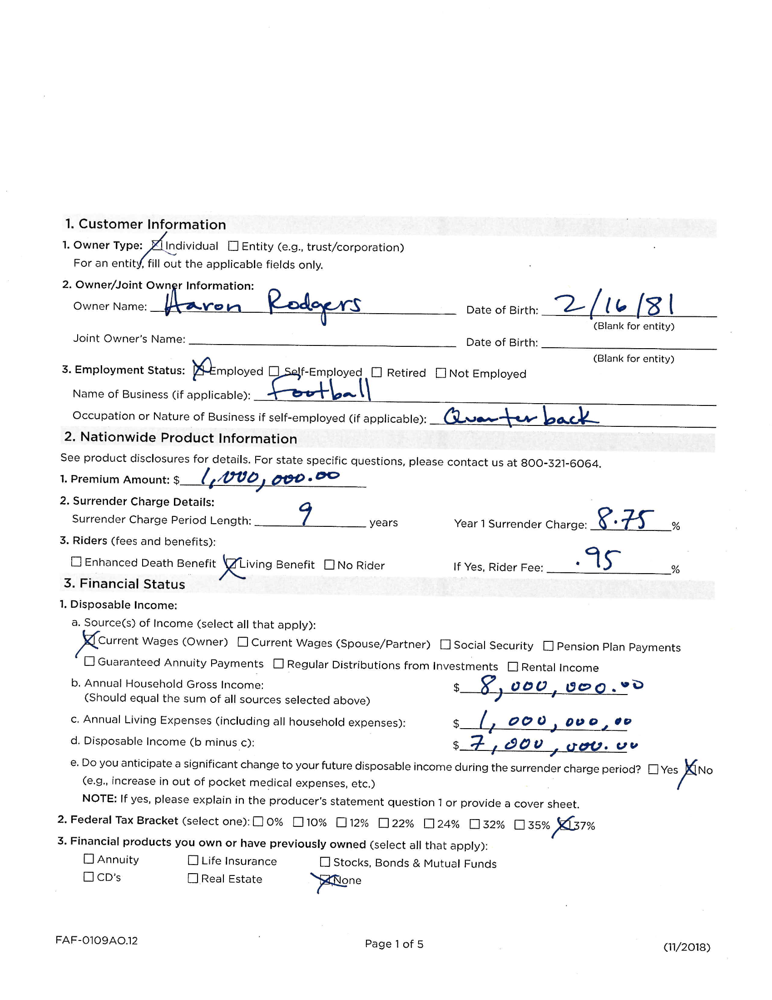

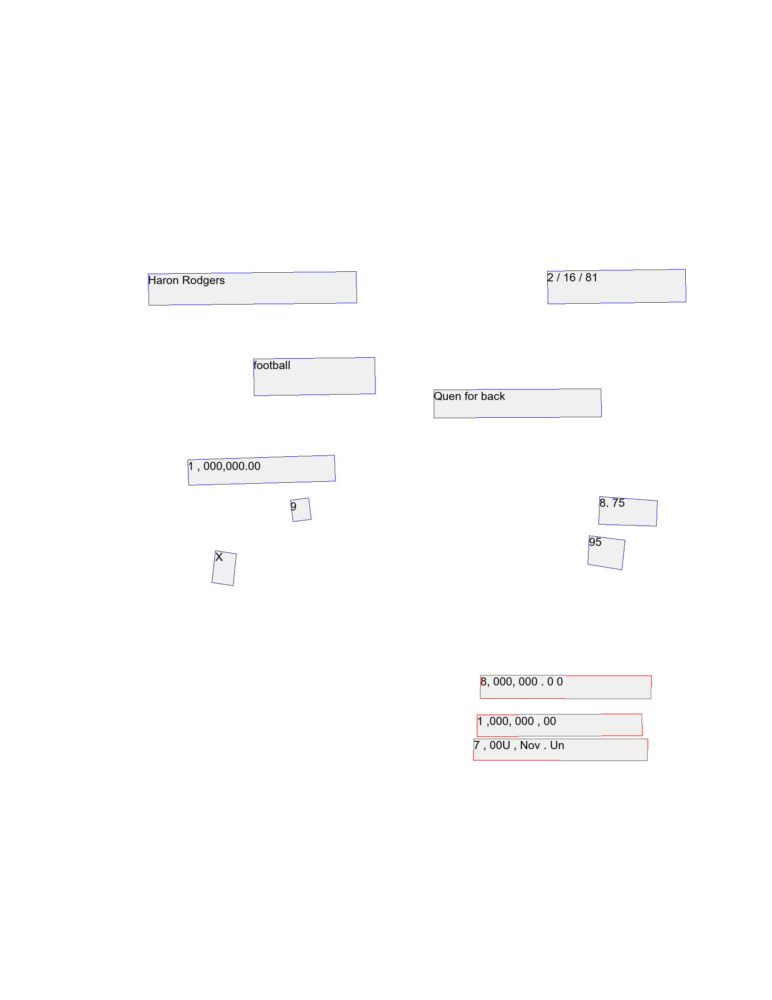

In [68]:
with open(jsonfile) as file:    
    analysis = json.load(file)

    polygons = [(line["boundingBox"], line["text"], line["words"]) for line in analysis["recognitionResult"]["lines"]]


    scored_image  = Image.new("RGBA", (1700, 2200), "white") #Image.open('{}{}'.format(inputpath, blnkimagename))

    draw = ImageDraw.Draw(scored_image)

    for polygon in polygons:
        vertices = [(polygon[0][i], polygon[0][i+1]) for i in range(0,len(polygon[0]),2)]
        text     = polygon[1]
        color = 'Blue'
        for word in polygon[2]:
            if(word.get('confidence')) == 'Low' :
                color = 'Red'

        draw.polygon(xy=vertices, fill=(240,240,240), outline=color)
        draw.text(xy=(vertices[0][0], vertices[0][1]), text=text, font=fnt, fill='Black')

    scored_image.save('{}{}.result.png'.format(outputpath,os.path.splitext(os.path.basename(jsonfile))[0],))

    display(image)
    display(scored_image)
